# Classification from images 

In this example we build a clasification model to recognise differnet kinds of images. This example uses limited data and is inspired by the keras blog post "Building powerful image classification models using very little data" from https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html. This example also uses data augmentation using the keras functions.

The datasets used are from kaggle 
* monkeys https://www.kaggle.com/slothkong/10-monkey-species/home 


In [12]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Conv2D, MaxPooling2D, Flatten
from keras.utils import np_utils
from keras import backend as K
from keras.utils.np_utils import to_categorical
from keras.utils.vis_utils import model_to_dot
from keras.wrappers.scikit_learn import KerasClassifier
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import RMSprop, adam
from keras import backend as K
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint

import sklearn
from sklearn.tree import export_graphviz
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn import preprocessing 
from sklearn.utils import shuffle

from IPython.display import SVG

import csv
import os 
import cv2
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import scipy as sp
import PIL

Using TensorFlow backend.


## Data

Set up the data set process. We provide the name of a folder contianing images. There are two assumptions:
* The images of differnet classes are contained in folders with class ids

In [0]:
# dataset name
dataset_name = '10-monkey-species'

# assuming data is contained in a train and a validation set
train_data_dir = 'training/'

# Set up some parmaeters for data loading
sample_rate = 1.0

# desired dimensions of our images.
img_width, img_height = 150, 150

# different backends (e.g. tensorflow and theano) use different orderings for image data - fix this!
if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

Load image data.

In [14]:
training_class_folders = [i for i in os.listdir(train_data_dir) if not i.startswith('.')] # use this for full dataset
num_classes = len(training_class_folders)

# Initialise arrays for data storage
X_data = np.ndarray((0, input_shape[0], input_shape[1], input_shape[2]), dtype=np.float)
y_data= np.ndarray(0, dtype=np.str)
    
# Loop through the class folders
for i, image_cls in enumerate(training_class_folders):
    
    print('Processing class {}'.format(image_cls))
    image_class_folder = train_data_dir + image_cls + "/"

    # generate filenames from the data folder and do sampling
    image_filenames = [image_class_folder+i for i in os.listdir(image_class_folder) if not i.startswith('.')] # use this for full dataset
    image_filenames = random.sample(image_filenames, int(len(image_filenames)*sample_rate))

    # Create a data array for image data
    count = len(image_filenames)
    X_data_part = np.ndarray((count, input_shape[0], input_shape[1], input_shape[2]), dtype=np.float)

    # Iterate throuigh the filenames and for each one load the image, resize and normalise
    for i, image_file in enumerate(image_filenames):

        # Low the images and resize them
        image = cv2.imread(image_file, cv2.IMREAD_COLOR)
        image = cv2.resize(image, (img_height, img_width), interpolation=cv2.INTER_CUBIC)        
        image = image[:,:,[2,1,0]] # OpenCV and matplotlib use differnet channel oerderings so fix this
        
        # If channel order of network does not match open cv format swap it
        if K.image_data_format() == 'channels_first':
            image=np.swapaxes(np.swapaxes(image, 1, 2), 0, 1)
            
        # Add image data to data array and normalise
        X_data_part[i] = image
        X_data_part[i] = X_data_part[i]/255
        
        # Add label to label array
        y_data = np.append(y_data, image_cls)
        
        if i%100 == 0: print('Processed {} of {} for class {} '.format(i, count, image_cls))

    print('Processed {} of {} for class {} '.format(i + 1, count, image_cls))
    
    # Append the part to the overall data array
    X_data = np.append(X_data, X_data_part, axis=0)
    
print("Data shape: {}".format(X_data.shape))

Processing class n0
Processed 0 of 105 for class n0 
Processed 100 of 105 for class n0 
Processed 105 of 105 for class n0 
Processing class n7
Processed 0 of 114 for class n7 
Processed 100 of 114 for class n7 
Processed 114 of 114 for class n7 
Processing class n6
Processed 0 of 106 for class n6 
Processed 100 of 106 for class n6 
Processed 106 of 106 for class n6 
Processing class n4
Processed 0 of 105 for class n4 
Processed 100 of 105 for class n4 
Processed 105 of 105 for class n4 
Processing class n3
Processed 0 of 122 for class n3 
Processed 100 of 122 for class n3 
Processed 122 of 122 for class n3 
Processing class n8
Processed 0 of 106 for class n8 
Processed 100 of 106 for class n8 
Processed 106 of 106 for class n8 
Processing class n9
Processed 0 of 106 for class n9 
Processed 100 of 106 for class n9 
Processed 106 of 106 for class n9 
Processing class n5
Processed 0 of 113 for class n5 
Processed 100 of 113 for class n5 
Processed 113 of 113 for class n5 
Processing class

Split data into training and test partitions

In [0]:
# Perfrom split to train, validation, test
X_train_plus_valid, X_test, y_train_plus_valid, y_test = train_test_split(X_data, y_data, random_state=0, test_size = 0.30, train_size = 0.7)

# Perfrom split to train, validation, test
X_train, X_valid, y_train, y_valid = train_test_split(X_train_plus_valid, y_train_plus_valid, random_state=0, test_size = 0.20, train_size = 0.8)

Reshape output data for use with a neural network.

In [0]:
# Convert class vectors to binary class matrices.
y_train_encoder = sklearn.preprocessing.LabelEncoder()
y_train_num = y_train_encoder.fit_transform(y_train)
y_train_wide = keras.utils.to_categorical(y_train_num, num_classes)

y_valid_num = y_train_encoder.fit_transform(y_valid)
y_valid_wide = keras.utils.to_categorical(y_valid_num, num_classes)

y_test_num = y_train_encoder.fit_transform(y_test)
y_test_wide = keras.utils.to_categorical(y_test_num, num_classes)

Record the number to label mapping 

In [0]:
classes_num_label = dict()
classes_num_label

for idx, lbl in enumerate(y_train_encoder.classes_):
    classes_num_label[idx] = lbl

Print a few randomly sampled example images.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
  # Remove the CWD from sys.path while we load stuff.


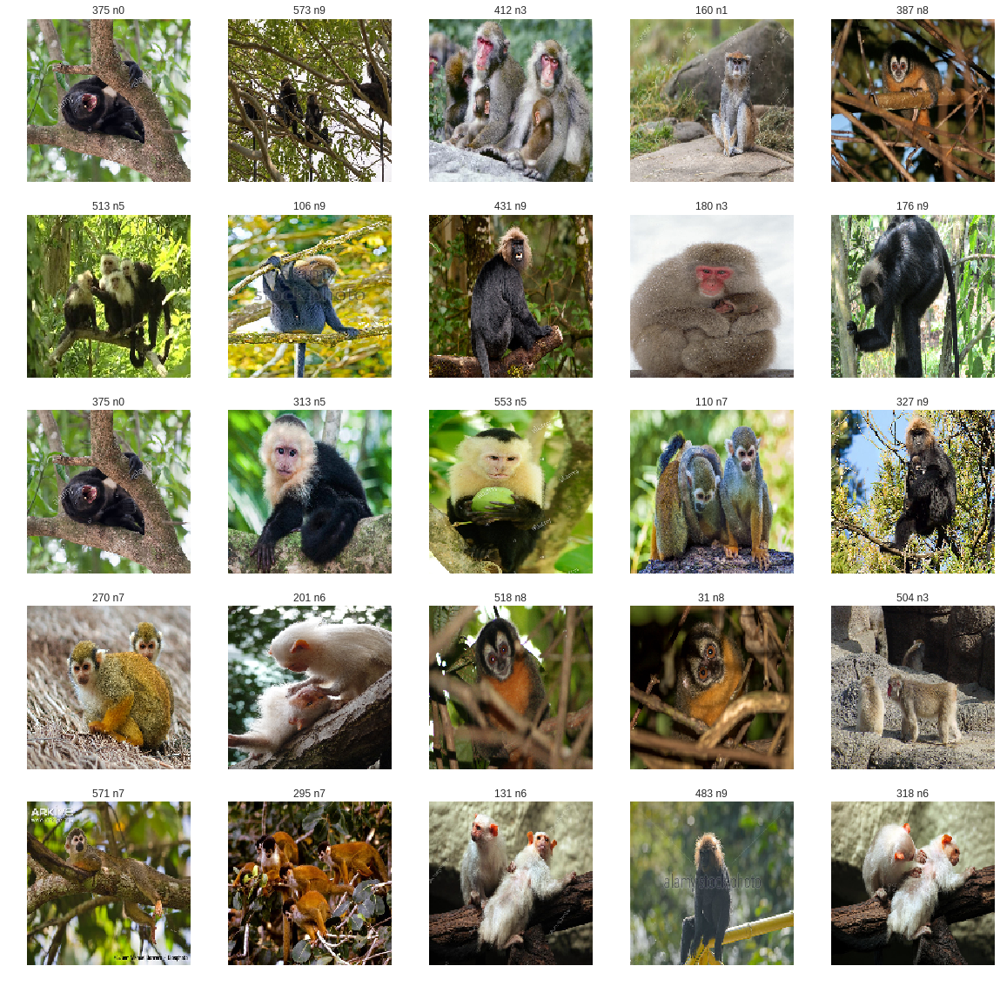

In [18]:
pltsize=4
row_images = 5
col_images = 5
plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(row_images * col_images):
    i_rand = random.randint(0, X_train.shape[0])
    plt.subplot(row_images,col_images,i+1)
    plt.axis('off')
    plt.imshow(sp.misc.toimage(X_train[i_rand]))
    plt.title((str(i_rand) + " " + y_train[i_rand]))
    # print('Training sample',i_rand,': class:',y_train[i_rand])

## Data Augmentation

Show off how data augmentation works by showing some examples.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


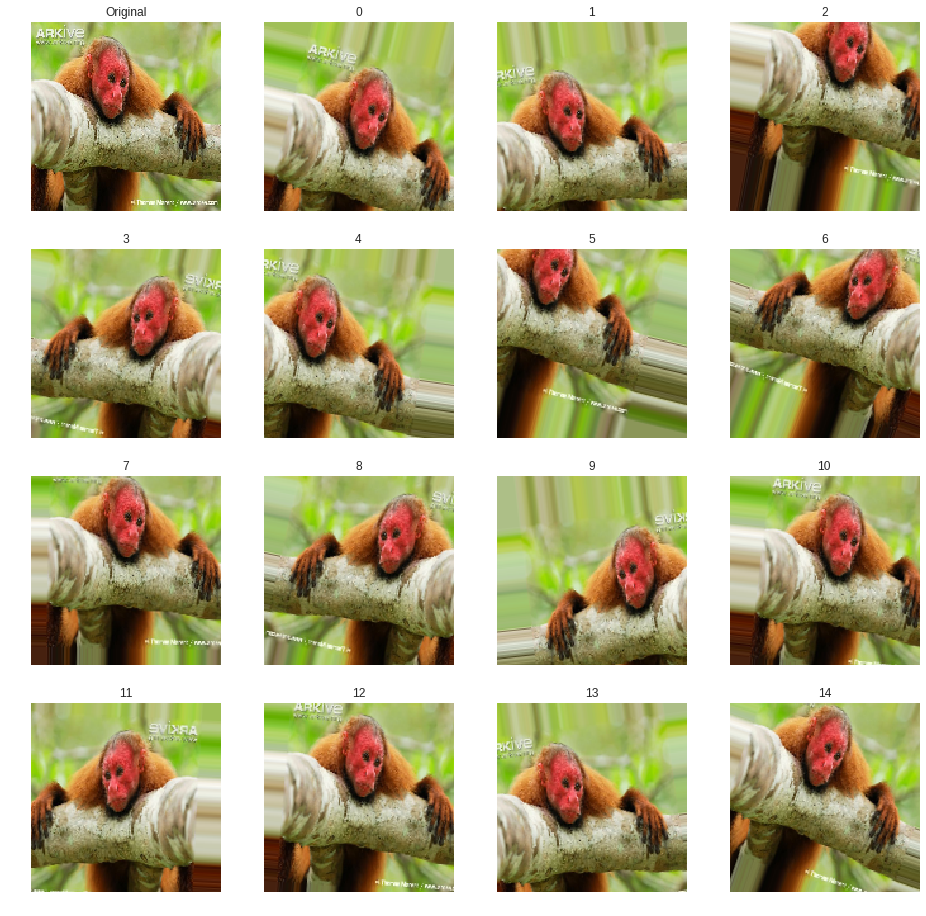

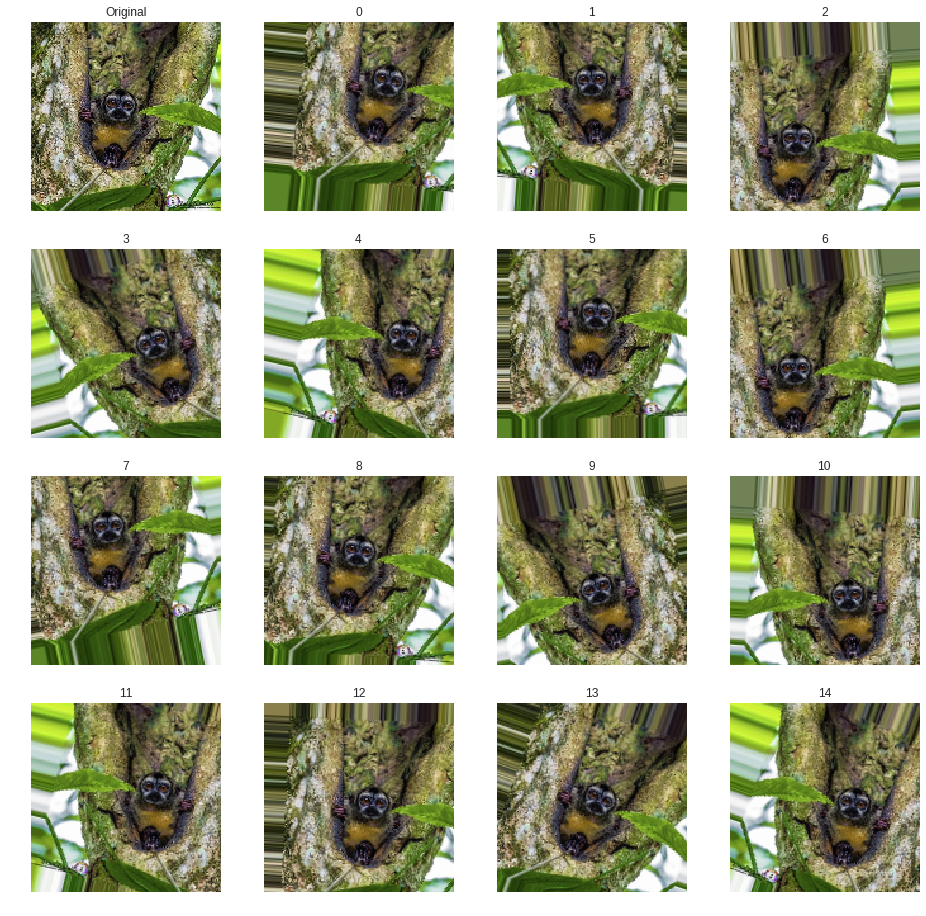

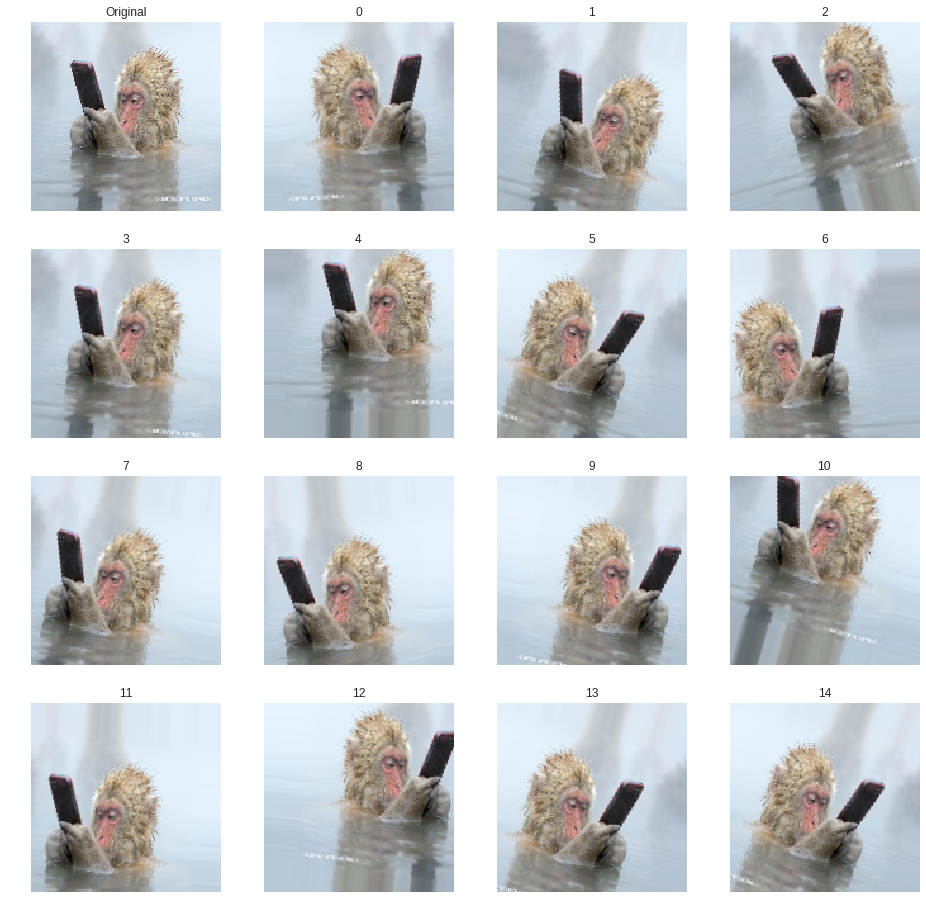

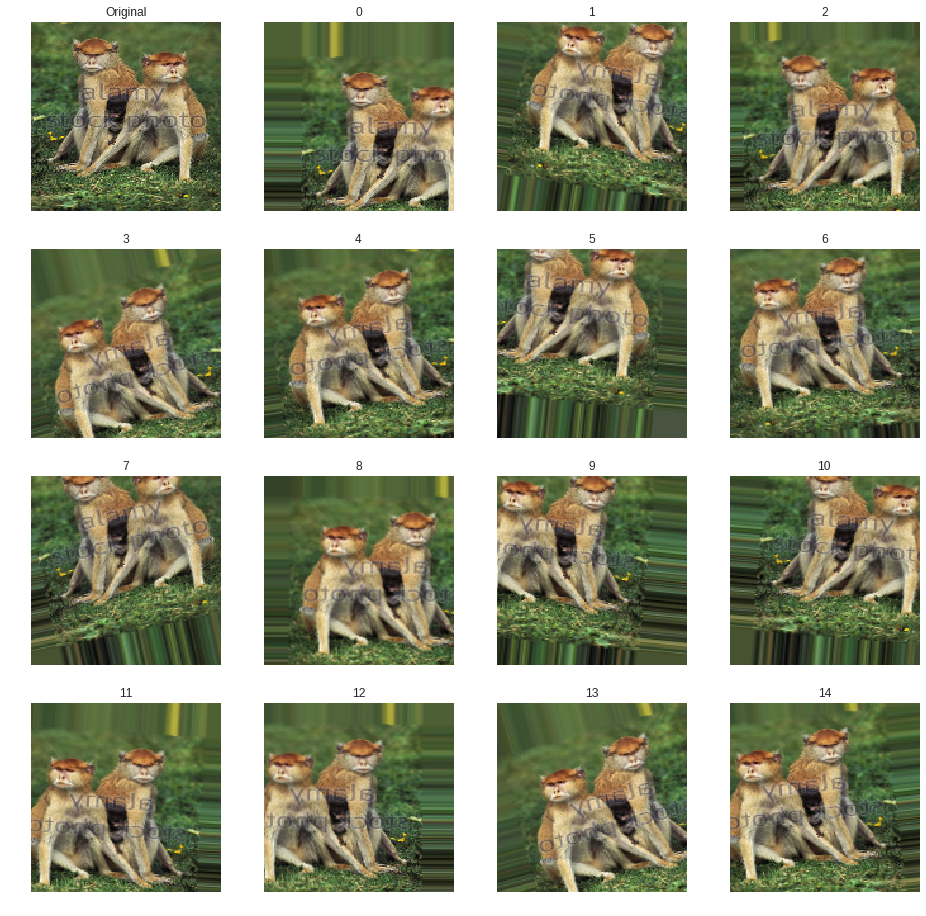

In [19]:
pltsize=4
row_images = 4
col_images = 4

# Create a transformed data generator
datagen = ImageDataGenerator(
    featurewise_center=False,
    featurewise_std_normalization=False,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

# fit parameters from data
datagen.fit(X_train)

for idx in range(0, 4):
    # Plot the original image
    plt.figure(figsize=(col_images*pltsize, row_images*pltsize))
    plt.subplot(row_images,col_images,1)
    plt.axis('off')
    plt.imshow(sp.misc.toimage(X_train[idx]))
    plt.title("Original")

    for i in range(row_images * col_images - 1):
        rand_trans = datagen.random_transform(X_train[idx])
        plt.subplot(row_images,col_images,i+2)
        plt.axis('off')
        plt.imshow(sp.misc.toimage(rand_trans))
        plt.title(i)

    plt.show()                             

## Modelling

Create model architecture

In [20]:
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(256, activation = 'relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation = 'softmax'))

model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

model.summary()

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
activation_1 (Activation)    (None, 148, 148, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 32)        9248      
_________________________________________________________________
activation_2 (Activation)    (None, 72, 72, 32)        0         
_________________________________________________________________
max_pooling2d_2 (MaxP

Train the model using on the fly data augmentation. We allow the model to overfit but save the best set of weights based on validation loss as we go. Then at the end of training (assuming the model has overfit) we revert back to the saved model

In [21]:
batch_size = 128
epochs = 100

# Set up the callback to save the best model based on validaion data
best_weights_filepath = './best_weights_notebook22.hdf5'
mcp = ModelCheckpoint(best_weights_filepath, monitor="val_loss",
                      save_best_only=True, save_weights_only=False)

# Create a data generator for the trianing data
datagen_train = ImageDataGenerator(
    featurewise_center=False,
    featurewise_std_normalization=False,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)
datagen_train.fit(X_train)
        
history = model.fit_generator(datagen_train.flow(X_train, y_train_wide, batch_size=batch_size),
          steps_per_epoch=len(X_train) / batch_size,
          validation_data=(X_valid, y_valid_wide),
          epochs=epochs,
          verbose = 1,
          shuffle=True,
          callbacks=[mcp])

#reload best weights
model.load_weights(best_weights_filepath)

Instructions for updating:
Use tf.cast instead.
Epoch 1/100
5/4 [===============================] - 39s 8s/step - loss: 0.3310 - acc: 0.9000 - val_loss: 0.3189 - val_acc: 0.9000
Epoch 2/100
5/4 [===============================] - 33s 7s/step - loss: 0.3211 - acc: 0.9000 - val_loss: 0.3145 - val_acc: 0.9000
Epoch 3/100
5/4 [===============================] - 33s 7s/step - loss: 0.3108 - acc: 0.9000 - val_loss: 0.2992 - val_acc: 0.9000
Epoch 4/100
5/4 [===============================] - 32s 6s/step - loss: 0.3007 - acc: 0.9007 - val_loss: 0.2852 - val_acc: 0.9013
Epoch 5/100
5/4 [===============================] - 33s 7s/step - loss: 0.2944 - acc: 0.8998 - val_loss: 0.2703 - val_acc: 0.9052
Epoch 6/100
5/4 [===============================] - 33s 7s/step - loss: 0.2817 - acc: 0.9008 - val_loss: 0.2596 - val_acc: 0.9026
Epoch 7/100
5/4 [===============================] - 32s 6s/step - loss: 0.2755 - acc: 0.9030 - val_loss: 0.2493 - val_acc: 0.9045
Epoch 8/100
5/4 [=========================

Plot some evaluation stats

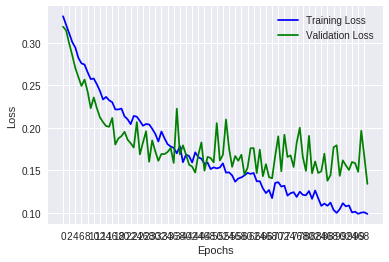

In [22]:
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.plot(loss, 'blue', label='Training Loss')
plt.plot(val_loss, 'green', label='Validation Loss')
plt.xticks(range(0,epochs)[0::2])
plt.legend()
plt.show()

In [23]:
# Make a set of predictions for the validation data
pred = model.predict_classes(X_train)

# Print performance details
print(metrics.classification_report(y_train_num, pred))
print("Confusion matrix")
print(metrics.confusion_matrix(y_train_num, pred))

              precision    recall  f1-score   support

           0       0.86      0.80      0.83        54
           1       0.95      0.92      0.93        59
           2       0.97      1.00      0.99        67
           3       0.98      0.93      0.96        61
           4       0.97      0.98      0.98        61
           5       0.98      0.78      0.87        67
           6       0.96      0.98      0.97        55
           7       0.97      0.97      0.97        79
           8       0.91      0.88      0.89        58
           9       0.66      0.92      0.77        53

   micro avg       0.92      0.92      0.92       614
   macro avg       0.92      0.92      0.92       614
weighted avg       0.93      0.92      0.92       614

Confusion matrix
[[43  0  0  0  0  0  0  0  0 11]
 [ 0 54  2  1  0  0  0  0  1  1]
 [ 0  0 67  0  0  0  0  0  0  0]
 [ 0  1  0 57  1  0  1  0  1  0]
 [ 0  0  0  0 60  0  0  0  1  0]
 [ 2  0  0  0  0 52  1  0  1 11]
 [ 0  1  0  0  0  0 54  0 

## Evaluation

In [24]:
# Make a set of predictions for the validation data
pred = model.predict_classes(X_test)

# Print performance details
print(metrics.classification_report(y_test_num, pred))
print("Confusion matrix")
print(metrics.confusion_matrix(y_test_num, pred))

              precision    recall  f1-score   support

           0       0.55      0.60      0.57        30
           1       0.72      0.80      0.76        41
           2       0.82      0.93      0.87        30
           3       0.92      0.80      0.86        41
           4       0.64      0.56      0.60        25
           5       0.70      0.52      0.59        31
           6       0.83      0.74      0.78        34
           7       0.46      0.71      0.56        24
           8       0.74      0.53      0.62        32
           9       0.57      0.62      0.59        42

   micro avg       0.69      0.69      0.69       330
   macro avg       0.69      0.68      0.68       330
weighted avg       0.70      0.69      0.69       330

Confusion matrix
[[18  0  0  0  0  1  0  0  0 11]
 [ 0 33  1  0  2  0  1  1  3  0]
 [ 0  2 28  0  0  0  0  0  0  0]
 [ 0  4  1 33  0  0  1  0  0  2]
 [ 0  1  0  1 14  1  0  6  2  0]
 [ 5  0  0  0  1 16  1  3  0  5]
 [ 0  1  0  1  0  2 25  4 

Draw some examples of correct classifications 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


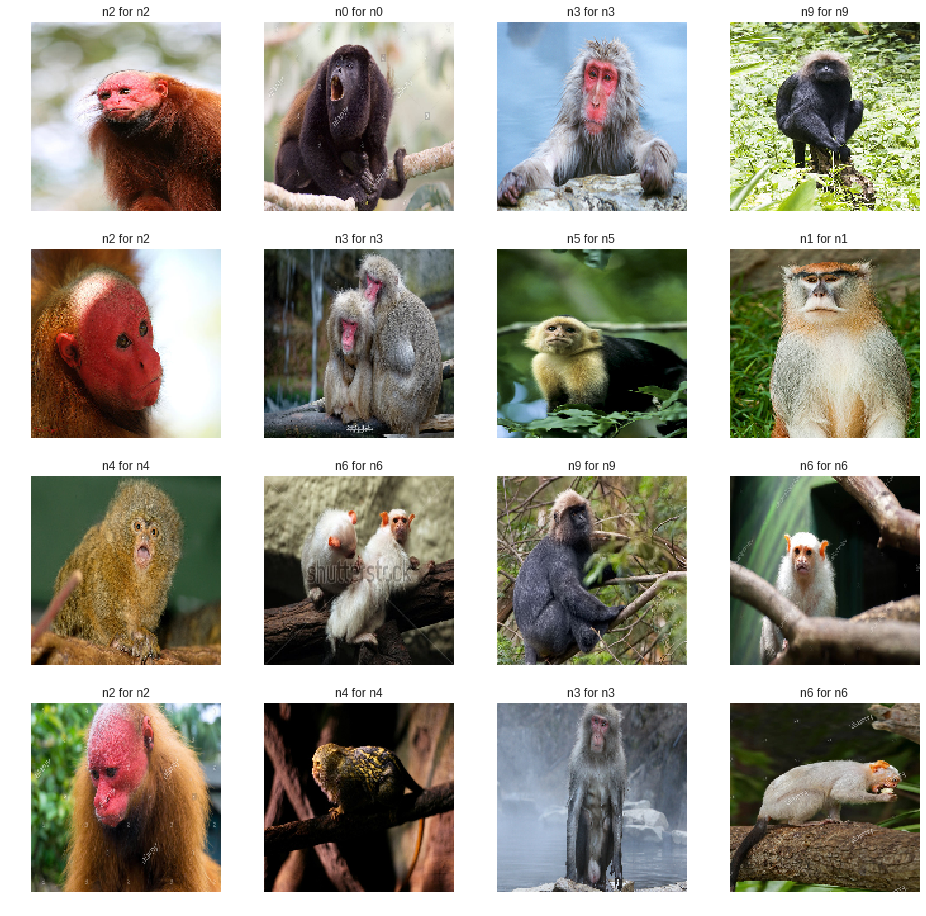

In [25]:
pltsize=4
row_images = 4
col_images = 4

maxtoshow = row_images * col_images
predictions = pred.reshape(-1)
corrects = predictions == y_test_num
ii = 0
plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(X_test.shape[0]):
    if ii>=maxtoshow:
        break
    if corrects[i]:
        plt.subplot(row_images,col_images, ii+1)
        plt.axis('off')
        plt.imshow(sp.misc.toimage(X_test[i]))
        plt.title("{} for {}".format(classes_num_label[predictions[i]], y_test[i]))
        ii = ii + 1

Draw some examples of mis-classifications 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


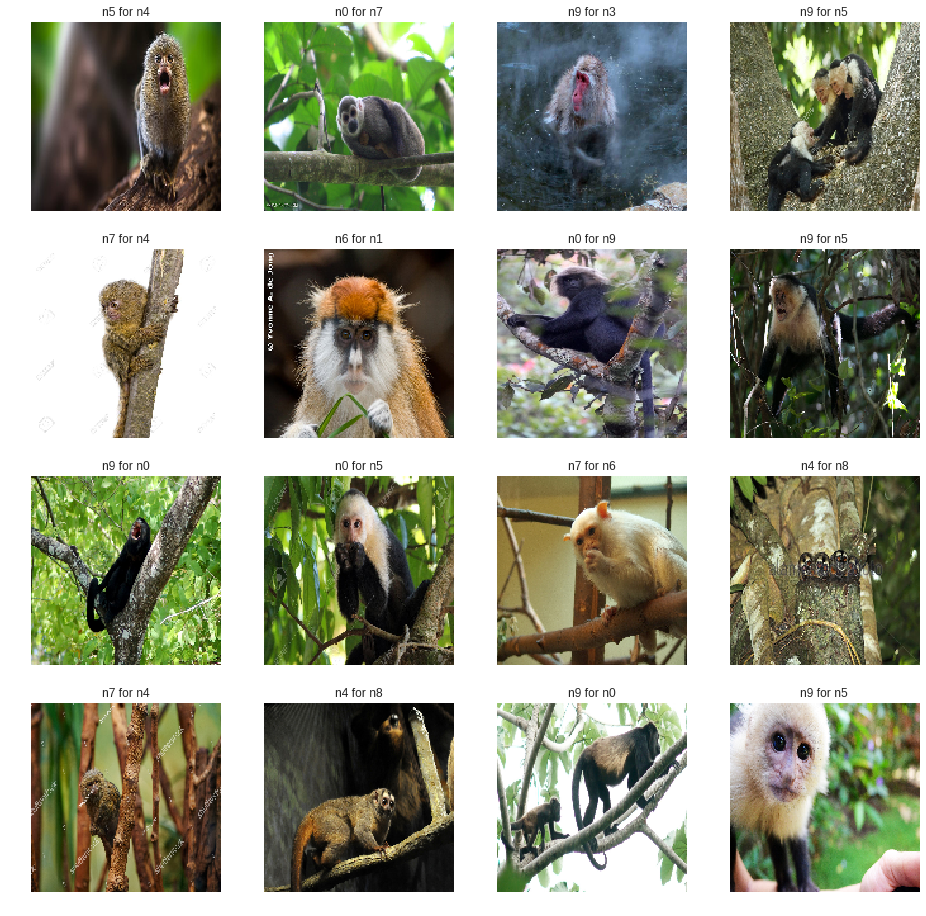

In [26]:
pltsize=4
row_images = 4
col_images = 4

maxtoshow = row_images * col_images
predictions = pred.reshape(-1)
errors = predictions != y_test_num
ii = 0
plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(X_test.shape[0]):
    if ii>=maxtoshow:
        break
    if errors[i]:
        plt.subplot(row_images,col_images, ii+1)
        plt.axis('off')
        plt.imshow(sp.misc.toimage(X_test[i]))
        plt.title("{} for {}".format(classes_num_label[predictions[i]], y_test[i]))
        ii = ii + 1

Vgg-16

In [27]:
vgg16_model = keras.applications.VGG16(weights='imagenet', include_top=False, input_shape = X_train[0].shape)
display(vgg16_model.summary())

58892288/58889256 [==============================] - 1s 0us/step
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool

None

In [28]:
top_weights_filepath = './best_weights_notebook22.hdf5'
old_model = keras.models.load_model(top_weights_filepath)
old_model.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
activation_1 (Activation)    (None, 148, 148, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 32)        9248      
_________________________________________________________________
activation_2 (Activation)    (None, 72, 72, 32)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 64)        18496     
__________

In [29]:
vgg16_last_layer = vgg16_model.output

# build a classifier model to put on top of the VGG16 model
x1 = Flatten()(vgg16_last_layer)
x2 = Dense(256, activation='relu')(x1)
x3 = Dropout(0.5)(x2)
final_layer = Dense(num_classes, activation = 'softmax')(x3)

# Assemble the full model out of both parts
full_model = keras.Model(vgg16_model.input, final_layer)

# moving over weights from a pre-trained smaller model specifically for our problem might help rather than random initialisation.
#top_weights_filepath = './best_weights_notebook22.hdf5'
#old_model = keras.models.load_model(top_weights_filepath)
#full_model.layers[-1].set_weights(old_model.layers[-1].get_weights())

# set the first 17 layers (up to the last conv block)
# to non-trainable (weights will not be updated)
for layer in full_model.layers[:17]:
    layer.trainable = False

# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
full_model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

full_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
__________

In [30]:
batch_size = 128
epochs = 100

# Set up the callback to save the best model based on validaion data - notebook 2.2 needs to be run first.
best_weights_filepath = './best_weights_notebook23.hdf5'
mcp = ModelCheckpoint(best_weights_filepath, monitor="val_loss",
                      save_best_only=True, save_weights_only=False)

history = full_model.fit(X_train, y_train_wide,
          batch_size=batch_size,
          epochs=epochs,
          verbose = 1,
          validation_split = 0.2,
          shuffle=True,
          callbacks=[mcp])

#reload best weights
model.load_weights(best_weights_filepath)

Train on 491 samples, validate on 123 samples
Epoch 1/100
491/491 [==============================] - 205s 417ms/step - loss: 0.4037 - acc: 0.8882 - val_loss: 0.3603 - val_acc: 0.9000
Epoch 2/100
491/491 [==============================] - 223s 455ms/step - loss: 0.4000 - acc: 0.8880 - val_loss: 0.3563 - val_acc: 0.9000
Epoch 3/100
491/491 [==============================] - 230s 469ms/step - loss: 0.3971 - acc: 0.8880 - val_loss: 0.3515 - val_acc: 0.9000
Epoch 4/100
491/491 [==============================] - 225s 459ms/step - loss: 0.4007 - acc: 0.8880 - val_loss: 0.3466 - val_acc: 0.9000
Epoch 5/100
491/491 [==============================] - 230s 468ms/step - loss: 0.3853 - acc: 0.8935 - val_loss: 0.3419 - val_acc: 0.9000
Epoch 6/100
491/491 [==============================] - 227s 463ms/step - loss: 0.3859 - acc: 0.8931 - val_loss: 0.3379 - val_acc: 0.9000
Epoch 7/100
491/491 [==============================] - 226s 460ms/step - loss: 0.3747 - acc: 0.8955 - val_loss: 0.3343 - val_acc: 0.

ValueError: ignored

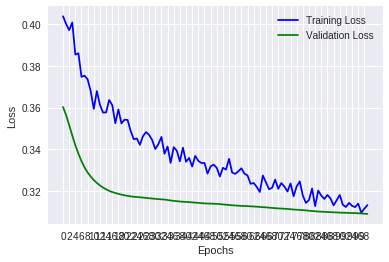

In [31]:
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.plot(loss, 'blue', label='Training Loss')
plt.plot(val_loss, 'green', label='Validation Loss')
plt.xticks(range(0,epochs)[0::2])
plt.legend()
plt.show()

In [32]:
# Make a set of predictions for the validation data
pred = np.argmax(full_model.predict(X_train),axis=1)

# Print performance details
print(metrics.classification_report(y_train_num, pred))
print("Confusion matrix")
print(metrics.confusion_matrix(y_train_num, pred))

              precision    recall  f1-score   support

           0       0.26      0.33      0.30        54
           1       0.17      0.03      0.06        59
           2       0.36      0.51      0.42        67
           3       0.41      0.31      0.36        61
           4       0.31      0.46      0.37        61
           5       0.32      0.31      0.32        67
           6       0.17      0.09      0.12        55
           7       0.30      0.38      0.33        79
           8       0.36      0.28      0.31        58
           9       0.31      0.36      0.33        53

   micro avg       0.31      0.31      0.31       614
   macro avg       0.30      0.31      0.29       614
weighted avg       0.30      0.31      0.30       614

Confusion matrix
[[18  0  6  0  3  3  0  6  5 13]
 [ 6  2  6 12  2  4  3 13  9  2]
 [ 6  1 34  2  5  6  0  6  1  6]
 [ 0  1 15 19 11  4  1  5  4  1]
 [ 5  1  7  2 28  4  6  6  1  1]
 [10  2  4  2  9 21  2 12  1  4]
 [ 9  3  6  1  7 10  5 11 

In [33]:
# Make a set of predictions for the validation data
pred = np.argmax(full_model.predict(X_test),axis=1)

# Print performance details
print(metrics.classification_report(y_test_num, pred))
print("Confusion matrix")
print(metrics.confusion_matrix(y_test_num, pred))

              precision    recall  f1-score   support

           0       0.13      0.20      0.16        30
           1       0.22      0.05      0.08        41
           2       0.18      0.33      0.24        30
           3       0.32      0.22      0.26        41
           4       0.16      0.24      0.19        25
           5       0.36      0.39      0.38        31
           6       0.06      0.03      0.04        34
           7       0.17      0.33      0.23        24
           8       0.23      0.19      0.21        32
           9       0.32      0.24      0.27        42

   micro avg       0.21      0.21      0.21       330
   macro avg       0.22      0.22      0.20       330
weighted avg       0.22      0.21      0.20       330

Confusion matrix
[[ 6  0  4  1  3  1  0  4  2  9]
 [ 3  2  6  6  2  4  5  5  6  2]
 [ 4  0 10  0  5  3  1  4  1  2]
 [ 5  1 11  9  3  2  3  4  2  1]
 [ 1  1  5  3  6  3  2  2  1  1]
 [ 4  1  4  2  2 12  0  3  2  1]
 [ 9  3  4  0  5  2  1  7 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


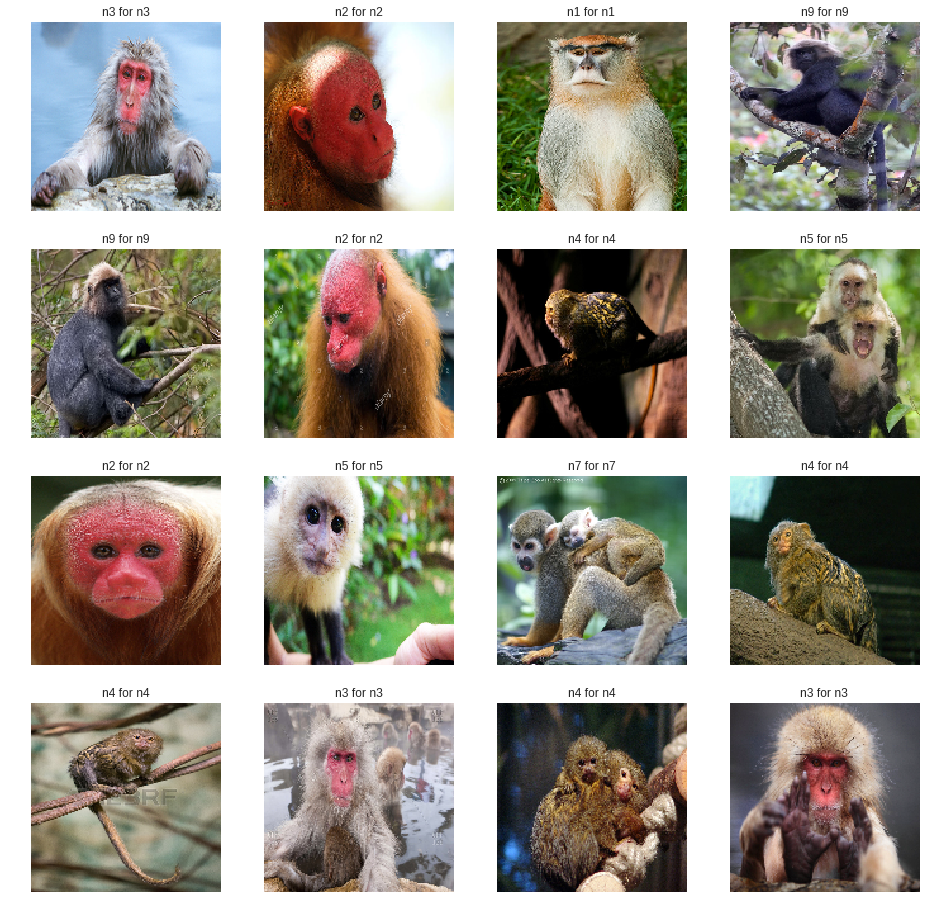

In [34]:
pltsize=4
row_images = 4
col_images = 4

maxtoshow = row_images * col_images
predictions = pred.reshape(-1)
corrects = predictions == y_test_num
ii = 0
plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(X_test.shape[0]):
    if ii>=maxtoshow:
        break
    if corrects[i]:
        plt.subplot(row_images,col_images, ii+1)
        plt.axis('off')
        plt.imshow(sp.misc.toimage(X_test[i]))
        plt.title("{} for {}".format(classes_num_label[predictions[i]], y_test[i]))
        ii = ii + 1